# Advanced Lane Finding Project (Finding Lane line / Warp image Part3)

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## TestImage Pipeline ##

In [1]:
import cv2
import glob
import pickle
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from sklearn.metrics import mean_squared_error

import pickle
import sys

import os
import pandas as pd
import matplotlib.gridspec as gridspec

import seaborn as sns

from PIL import Image
from skimage.transform import rescale, resize, rotate
from skimage.color import gray2rgb, rgb2gray
from skimage import transform, filters, exposure
from skimage.io import imread, imsave

from scipy.ndimage.interpolation import rotate

import platform

%matplotlib inline


In [93]:
from utils import pipelineBinaryImage, pipelineBinaryImage2

### common function to set threshhold values ###

In [2]:
def threshold(img, thresh_min=0, thresh_max=255):
    # 
    # Applies a threshold to the `img` using [`thresh_min`, `thresh_max`] returning a binary image [0, 255]
    # 
    xbinary = np.zeros_like(img)
    xbinary[(img >= thresh_min) & (img <= thresh_max)] = 1
    
    return xbinary
    

In [ ]:
def region_of_interest(img, vertices):
    # Defining a blank mask to start with
    mask = np.zeros_like(img)
    ignore_mask_color = 255
    # Fill pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    # Return the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

In [3]:
def rgb2gray(rgb):
    #convert rgb to gray scale
    r, g, b = rgb[:, :,:,0], rgb[:, :,:,1], rgb[:,:,:,2]
    gray = 0.2989 * r + 0.5870 * g + 0.1140 * b
    return gray


In [4]:
def histogram_equalize(img):
    b, g, r = cv2.split(img)
    red = cv2.equalizeHist(r)
    green = cv2.equalizeHist(g)
    blue = cv2.equalizeHist(b)
    return cv2.merge((blue, green, red))

In [110]:
def displayImage2x1(originalImage,modifiedImage,origTitle,modTitle,gray1=False, gray2=False):
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()

    if gray1 == True:
        ax1.imshow(originalImage, cmap="gray")
    else:
        ax1.imshow(originalImage)
    ax1.set_title(origTitle, fontsize=50)

    if gray2 == True:
        ax2.imshow(modifiedImage,cmap="gray")
    else:
        ax2.imshow(modifiedImage)
    ax2.set_title(modTitle, fontsize=50)
    
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

def displayImage2x4(filenames,images,mysubtitle="Display Images",gray=False):

        gs1 = gridspec.GridSpec(4, 2)
        gs1.update(wspace=0.01, hspace=0.02) # set the spacing between axes.
        plt.figure(figsize=(26,22))
        plt.suptitle(mysubtitle, fontsize=24)
        for i in range(8):
            ax1 = plt.subplot(gs1[i])
            ax1.set_xticklabels([])
            ax1.set_yticklabels([])
            ax1.set_aspect('equal')
            #img = transform_image(image,20,10,5,brightness=1)

            #plt.tight_layout()
            plt.subplot(4,2,i+1)
            if gray:
                plt.imshow(images[i], cmap = "gray")
            else:
                plt.imshow(images[i])
            plt.title(filenames[i],fontsize=18)
            plt.axis('off')

        plt.show()


## load saved pickle camera calibration parameters ##

In [18]:
# Read in the saved camera matrix and distortion coefficients
# These are the arrays you calculated using cv2.calibrateCamera()
dist_pickle = pickle.load( open( "./pickled_data/calibration.p", "rb" ) )
mtx = dist_pickle["mtx"]
dist = dist_pickle["dist"]


# Load Test images and undistortion images from saved directory #

In [36]:
#
# load test images from test_images directory
#
# read with skimage.io.imread (RGB mode)

filenames = sorted( os.listdir("./test_images/") )
images = list( map( lambda x: imread( os.path.join("./test_images",x)), filenames) )

#undistort_filenames = sorted( os.listdir("./undistort/") )
#undistort_images = list( map( lambda x: imread( os.path.join("./undistort",x)), filenames) )

undist_ops = lambda img:cv2.undistort(img, mtx, dist, None, mtx)
undistort_images = list( map( undist_ops, images ) )


#displayImage2x4(filenames,images, "Original Test Images = 8 images ")

In [37]:
for f, unf in zip(filenames,undistort_filenames):
    print(f, unf)

straight_lines1.jpg straight_lines1.jpg
straight_lines2.jpg straight_lines2.jpg
test1.jpg test1.jpg
test2.jpg test2.jpg
test3.jpg test3.jpg
test4.jpg test4.jpg
test5.jpg test5.jpg
test6.jpg test6.jpg


# reading chessboard image files #

In [7]:
# read chess board images 
imagefiles = glob.glob('./camera_cal/calibration*.jpg')
print(imagefiles)

['./camera_cal/calibration5.jpg', './camera_cal/calibration4.jpg', './camera_cal/calibration6.jpg', './camera_cal/calibration7.jpg', './camera_cal/calibration3.jpg', './camera_cal/calibration2.jpg', './camera_cal/calibration1.jpg', './camera_cal/calibration20.jpg', './camera_cal/calibration19.jpg', './camera_cal/calibration18.jpg', './camera_cal/calibration15.jpg', './camera_cal/calibration14.jpg', './camera_cal/calibration16.jpg', './camera_cal/calibration17.jpg', './camera_cal/calibration13.jpg', './camera_cal/calibration12.jpg', './camera_cal/calibration10.jpg', './camera_cal/calibration11.jpg', './camera_cal/calibration9.jpg', './camera_cal/calibration8.jpg']


## Draw the rectange lines for indentifying the lane lines on the road ##

* for the reference 

In [76]:
# check out the image shape

undistort_images[0].shape[:2]


(720, 1280)

In [102]:
def undistort_corners_unwarp(img, src, mtx, dist):

    # image has been already distorted.
    # undist = cv2.undistort(img, mtx, dist, None, mtx)
    
    # Convert undistorted image to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    img_size = (gray.shape[1], gray.shape[0])
    
    # Define 4 destination points
    
    # Mar. 10, 2018 
    # dst is selected after a number of experimental trial to find
    # what is best destination combination to show 
    # straight line of the warped image 
    dst = np.float32([[320, img.shape[0]], [320, 0], 
                      [960, 0], [960, img.shape[0]]])
    
    # Given src and dst points, calculate the perspective transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    #Minv = cv2.getPerspectiveTransform(dst, src)
    # Warp the image using OpenCV warpPerspective()
    warped = cv2.warpPerspective(img, M, img_size)

    # Return the resulting image and matrix
    return warped, M

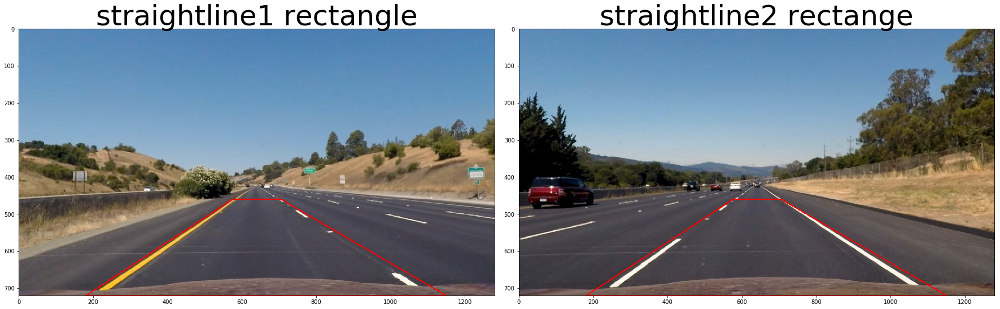

In [103]:
#
# undistort_images[0] -> straight lines road
# undistort_images[1] -> straight lines road
#
xSize, ySize = undistort_images[0].shape[:2]
straight1 = undistort_images[0].copy()
straight2 = undistort_images[1].copy()


#  left 190 , 720
#  left 585 , 455
#  right 705, 455
#  right 1130, 720

# source points for straigt line 1 & 2

# src is common parameter for straight1 line ...

# 180 720 is bottom left 
# 575 460 is upper left
# 705 460 is upper right 
# 1150 720 is bottom right

src = np.float32([[180, straight1.shape[0]], [575, 460], 
                  [705, 460], [1150, straight1.shape[0]]])

color = [255, 0, 0] # RED
w = 2

for st in [straight1,straight2]:
    cv2.line(st, tuple(src[0]), tuple(src[1]), color, w)
    cv2.line(st, tuple(src[1]), tuple(src[2]), color, w)
    cv2.line(st, tuple(src[2]), tuple(src[3]), color, w)
    cv2.line(st, tuple(src[3]), tuple(src[0]), color, w)

displayImage2x1(straight1,straight2,"straightline1 rectangle","straightline2 rectange",gray=False)

In [104]:
#straight1 = undistort_images[0].copy()
#straight2 = undistort_images[1].copy()

warp_straight1, pM1 = undistort_corners_unwarp(straight1, src, mtx, dist)
warp_straight2, pM2 = undistort_corners_unwarp(straight2, src, mtx, dist)

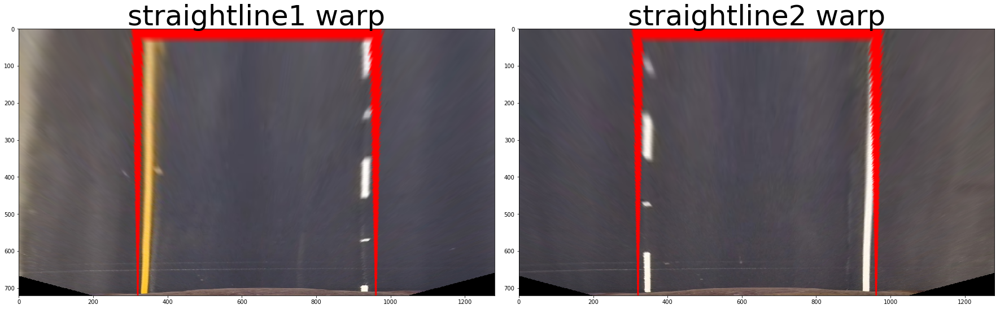

In [105]:
displayImage2x1(warp_straight1,warp_straight2,"straightline1 warp","straightline2 warp",gray=False)

In [42]:
perspective_M_st1 == perspective_M_st2

array([[ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True]])

In [ ]:
# Now it is time to try the curved lane line of the road #

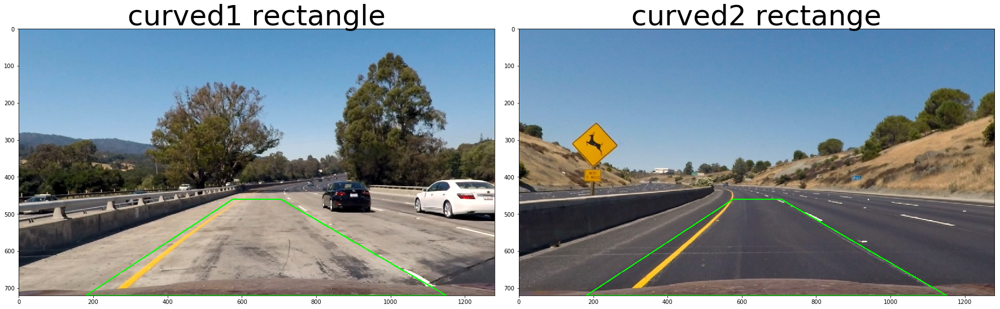

In [108]:
#
# undistort_images[2] -> curved lines road
# undistort_images[3] -> curved lines road
#
xSize, ySize = undistort_images[2].shape[:2]
curved1 = undistort_images[2].copy()
curved2 = undistort_images[3].copy()
# source points for straigt line 1 & 2

# src is common parameter for straight1 line ...

# 180 720 is bottom left 
# 575 460 is upper left
# 705 460 is upper right 
# 1150 720 is bottom right

src = np.float32([[180, straight1.shape[0]], [575, 460], 
                  [705, 460], [1150, straight1.shape[0]]])

color = [0, 255, 0] # GREEN
w = 2

for st in [curved1,curved2]:
    cv2.line(st, tuple(src[0]), tuple(src[1]), color, w)
    cv2.line(st, tuple(src[1]), tuple(src[2]), color, w)
    cv2.line(st, tuple(src[2]), tuple(src[3]), color, w)
    cv2.line(st, tuple(src[3]), tuple(src[0]), color, w)

displayImage2x1(curved1,curved2,"curved1 rectangle","curved2 rectange",gray=False)

In [109]:
curved1 = undistort_images[2].copy()
curved2 = undistort_images[3].copy()

warp_curved1, perspective_M_crv1 = undistort_corners_unwarp(curved1, src, mtx, dist)
warp_curved2, perspective_M_crv2 = undistort_corners_unwarp(curved2, src, mtx, dist)

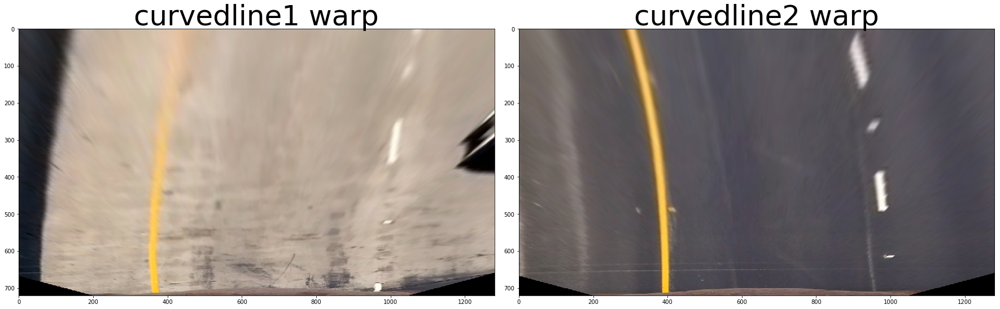

In [101]:
displayImage2x1(warp_curved1,warp_curved2,"curvedline1 warp","curvedline2 warp",gray=False)

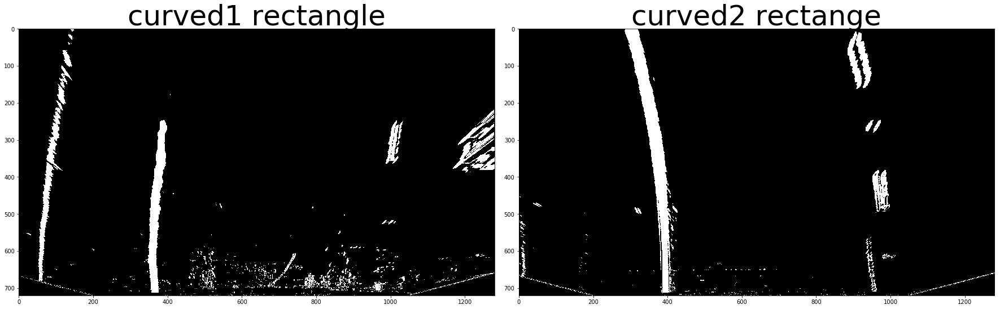

In [111]:
binary1 = pipelineBinaryImage(warp_curved1)
binary2 = pipelineBinaryImage(warp_curved2)

displayImage2x1(binary1,binary2,"curved1 rectangle","curved2 rectange",True,True)

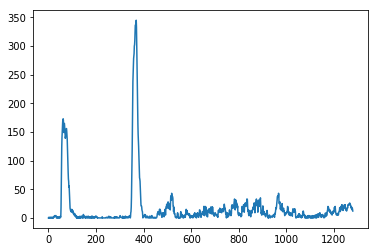

In [114]:
histogram1 = np.sum(binary1[  binary1.shape[0]//2:,:  ], axis=0)
plt.plot(histogram1)

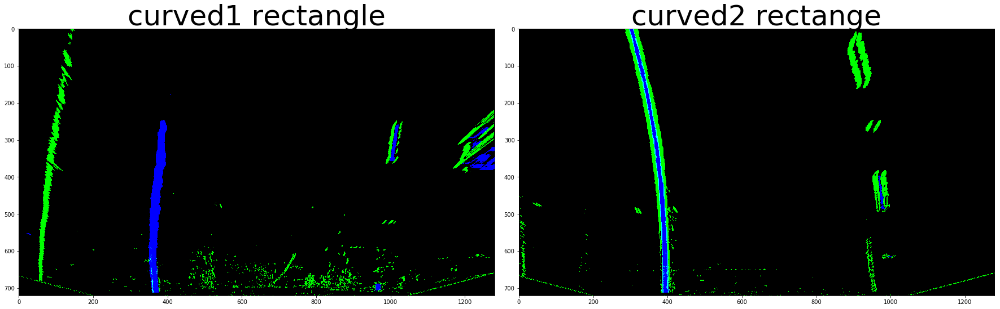

In [116]:
colored1, binary_1 = pipelineBinaryImage2(warp_curved1)
colored2, binary_2 = pipelineBinaryImage2(warp_curved2)

displayImage2x1(colored1,colored2,"curved1 rectangle","curved2 rectange")

In [140]:
def slidingWindow(binary_warped):
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
        (0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
        (0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    
    #
    # Visualize 
    #
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    return left_fit, right_fit, out_img
    
    


(720, 0)

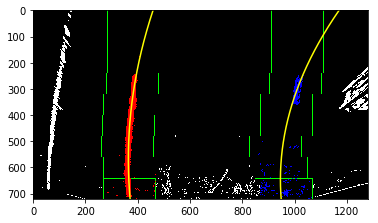

In [141]:
left_fit, right_fit, out_img = slidingWindow(binary1)

ploty = np.linspace(0, binary1.shape[0]-1, binary1.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]


plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)


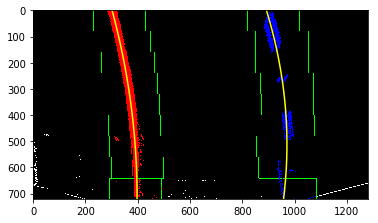

In [121]:
slidingWindow(binary2)

In [142]:
binary_warped = binary1.copy()
# Assume you now have a new warped binary image 
# from the next frame of video (also called "binary_warped")
# It's now much easier to find line pixels!
nonzero = binary_warped.nonzero()

print(nonzero)

nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
margin = 100
left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
left_fit[1]*nonzeroy + left_fit[2] + margin))) 


print(left_lane_inds)

right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
right_fit[1]*nonzeroy + right_fit[2] + margin)))  

# Again, extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds] 
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds]
# Fit a second order polynomial to each
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)
# Generate x and y values for plotting
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

(array([  0,   0,   0, ..., 719, 719, 719]), array([ 138,  139,  140, ...,  902, 1052, 1054]))
[False False False ... False False False]


(720, 0)

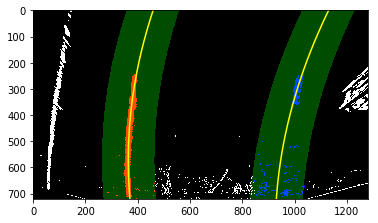

In [143]:
out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
window_img = np.zeros_like(out_img)
# Color in left and right line pixels
out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

# Generate a polygon to illustrate the search window area
# And recast the x and y points into usable format for cv2.fillPoly()
left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
left_line_pts = np.hstack((left_line_window1, left_line_window2))
right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
right_line_pts = np.hstack((right_line_window1, right_line_window2))

# Draw the lane onto the warped blank image
cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
plt.imshow(result)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

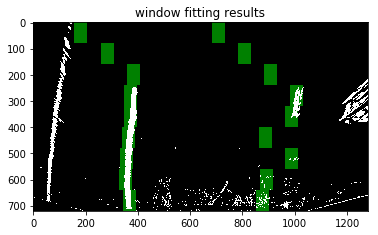

In [125]:
window_width = 50 
window_height = 80 # Break image into 9 vertical layers since image height is 720
margin = 100 # How much to slide left and right for searching

def window_mask(width, height, img_ref, center,level):
    output = np.zeros_like(img_ref)
    output[int(img_ref.shape[0]-(level+1)*height):int(img_ref.shape[0]-level*height),max(0,int(center-width/2)):min(int(center+width/2),img_ref.shape[1])] = 1
    return output

def find_window_centroids(image, window_width, window_height, margin):
    
    window_centroids = [] # Store the (left,right) window centroid positions per level
    window = np.ones(window_width) # Create our window template that we will use for convolutions
    
    # First find the two starting positions for the left and right lane by using np.sum to get the vertical image slice
    # and then np.convolve the vertical image slice with the window template 
    
    # Sum quarter bottom of image to get slice, could use a different ratio
    l_sum = np.sum(image[int(3*image.shape[0]/4):,:int(image.shape[1]/2)], axis=0)
    l_center = np.argmax(np.convolve(window,l_sum))-window_width/2
    r_sum = np.sum(image[int(3*image.shape[0]/4):,int(image.shape[1]/2):], axis=0)
    r_center = np.argmax(np.convolve(window,r_sum))-window_width/2+int(image.shape[1]/2)
    
    # Add what we found for the first layer
    window_centroids.append((l_center,r_center))
    
    # Go through each layer looking for max pixel locations
    for level in range(1,(int)(image.shape[0]/window_height)):
        # convolve the window into the vertical slice of the image
        image_layer = np.sum(image[int(image.shape[0]-(level+1)*window_height):int(image.shape[0]-level*window_height),:], axis=0)
        conv_signal = np.convolve(window, image_layer)
        # Find the best left centroid by using past left center as a reference
        # Use window_width/2 as offset because convolution signal reference is at right side of window, not center of window
        offset = window_width/2
        l_min_index = int(max(l_center+offset-margin,0))
        l_max_index = int(min(l_center+offset+margin,image.shape[1]))
        l_center = np.argmax(conv_signal[l_min_index:l_max_index])+l_min_index-offset
        # Find the best right centroid by using past right center as a reference
        r_min_index = int(max(r_center+offset-margin,0))
        r_max_index = int(min(r_center+offset+margin,image.shape[1]))
        r_center = np.argmax(conv_signal[r_min_index:r_max_index])+r_min_index-offset
        # Add what we found for that layer
        window_centroids.append((l_center,r_center))

    return window_centroids

window_centroids = find_window_centroids(binary1, window_width, window_height, margin)

def genSlidingOutput(warped, window_centroids):
    # If we found any window centers
    if len(window_centroids) > 0:

        # Points used to draw all the left and right windows
        l_points = np.zeros_like(warped)
        r_points = np.zeros_like(warped)

        # Go through each level and draw the windows 	
        for level in range(0,len(window_centroids)):
            # Window_mask is a function to draw window areas
            l_mask = window_mask(window_width,window_height,warped,window_centroids[level][0],level)
            r_mask = window_mask(window_width,window_height,warped,window_centroids[level][1],level)
            # Add graphic points from window mask here to total pixels found 
            l_points[(l_points == 255) | ((l_mask == 1) ) ] = 255
            r_points[(r_points == 255) | ((r_mask == 1) ) ] = 255

        # Draw the results
        template = np.array(r_points+l_points,np.uint8) # add both left and right window pixels together
        zero_channel = np.zeros_like(template) # create a zero color channel
        template = np.array(cv2.merge((zero_channel,template,zero_channel)),np.uint8) # make window pixels green
        warpage= np.dstack((warped, warped, warped))*255 # making the original road pixels 3 color channels
        output = cv2.addWeighted(warpage, 1, template, 0.5, 0.0) # overlay the orignal road image with window results

    # If no window centers found, just display orginal road image
    else:
        output = np.array(cv2.merge((warped,warped,warped)),np.uint8)

    return output

output = genSlidingOutput(binary1, window_centroids)

# Display the final results
plt.imshow(output)
plt.title('window fitting results')
plt.show()

# Check RGB Yellow  / White / HLS Yellow Line #

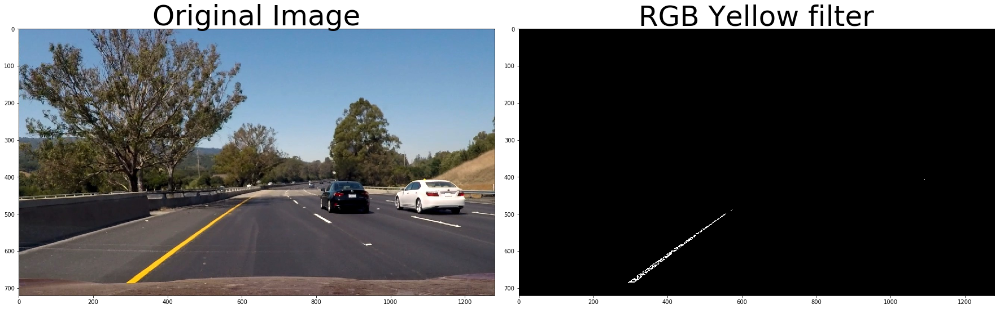

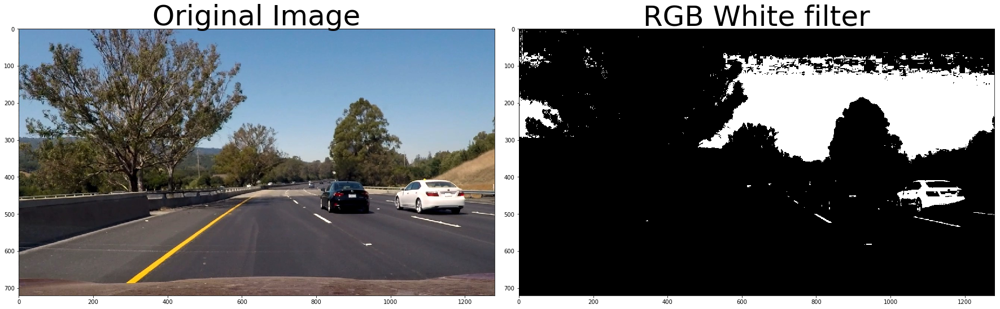

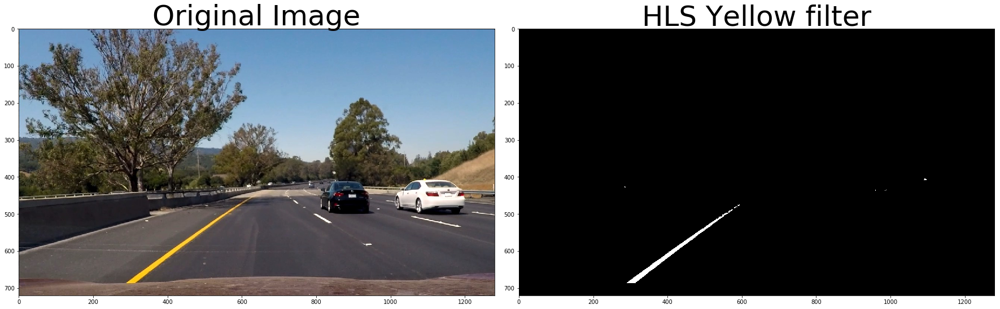

In [10]:
def threshColoredImageBin(image):

    bin_thresh_min = 20
    bin_thresh_max = 255
    # rgb Yellow colored mask
    lower = np.array([255,180,0]).astype(np.uint8)
    upper = np.array([255,255,170]).astype(np.uint8)
    mask = cv2.inRange(image,lower,upper)
    rgb_y = cv2.bitwise_and(image, image, mask=mask)
    gray = cv2.cvtColor(rgb_y, cv2.COLOR_RGB2GRAY)
    y_binary = threshold(gray, bin_thresh_min, bin_thresh_max)

    displayImage2x1(image,y_binary,"Original Image","RGB Yellow filter",True)
    # rgb white colored mask
    lower = np.array([100,100,200]).astype(np.uint8)
    upper = np.array([255,255,255]).astype(np.uint8)
    mask = cv2.inRange(image,lower,upper)
    rgb_y = cv2.bitwise_and(image, image, mask=mask)
    gray = cv2.cvtColor(rgb_y, cv2.COLOR_RGB2GRAY)
    w_binary = threshold(gray, bin_thresh_min, bin_thresh_max)

    displayImage2x1(image,w_binary,"Original Image","RGB White filter",True)
    
    # HLS Yellow masking
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)

    # rgb white colored mask
    lower = np.array([20,120,80]).astype(np.uint8)
    upper = np.array([45,200,255]).astype(np.uint8)
    mask = cv2.inRange(hls,lower,upper)
    hls_y = cv2.bitwise_and(image, image, mask=mask)
    hls_y = cv2.cvtColor(hls_y, cv2.COLOR_HLS2RGB)    
    gray = cv2.cvtColor(hls_y, cv2.COLOR_RGB2GRAY)
    y_hls_binary = threshold(gray, bin_thresh_min, bin_thresh_max)

    displayImage2x1(image,y_hls_binary,"Original Image","HLS Yellow filter",True)
    
    binary = np.zeros_like(y_binary)
    binary[ (y_binary == 1) | (w_binary == 1) | (y_hls_binary == 1) ] = 1

    return binary
    
binary = threshColoredImageBin(mytest_image)
#displayImage2x1(mytest_image,binary,"Original Image","RGB Y+RGB W+HLS Y mixed Image",True)
    

## Mixed Masking Image for Yellow White and HLS Yellow line ##
***
* Mixed binary image fairly shows robust image for lane lines, both of which has good contrast to identify as one solid line in binary image.

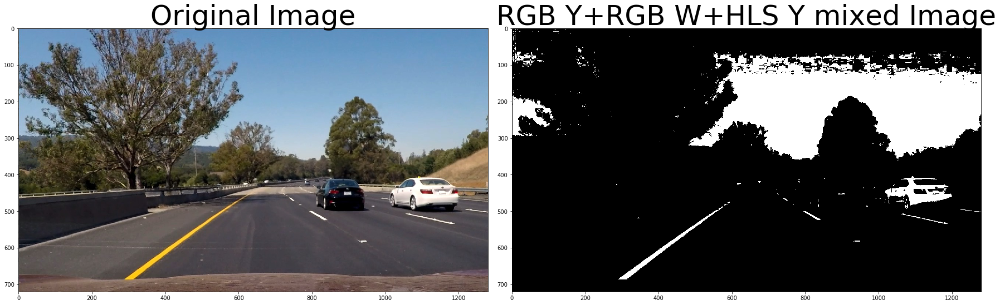

In [11]:
#binary = threshColoredImageBin(mytest_image)
displayImage2x1(mytest_image,binary,"Original Image","RGB Y+RGB W+HLS Y mixed Image",True)
    

# Check RGB White Line #

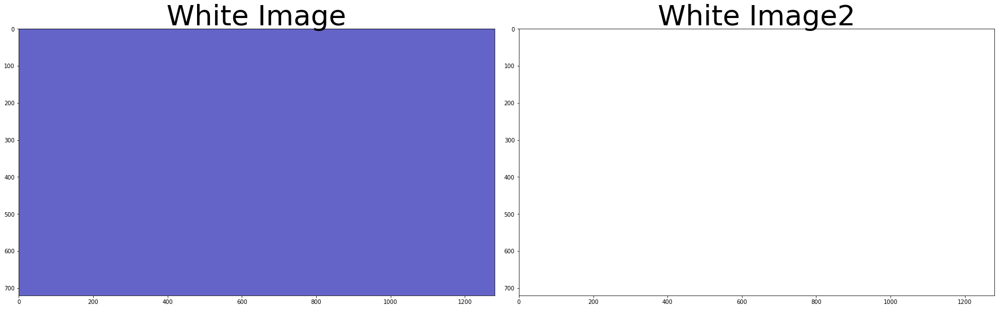

In [28]:
#
# RGB Wjite 
#
binary[:,:,0] = 100
binary[:,:,1] = 100
binary[:,:,2] = 200
binary2[:,:,0] = 255
binary2[:,:,1] = 255
binary2[:,:,2] = 255

displayImage2x1(binary,binary2,"White Image","White Image2",gray=True)


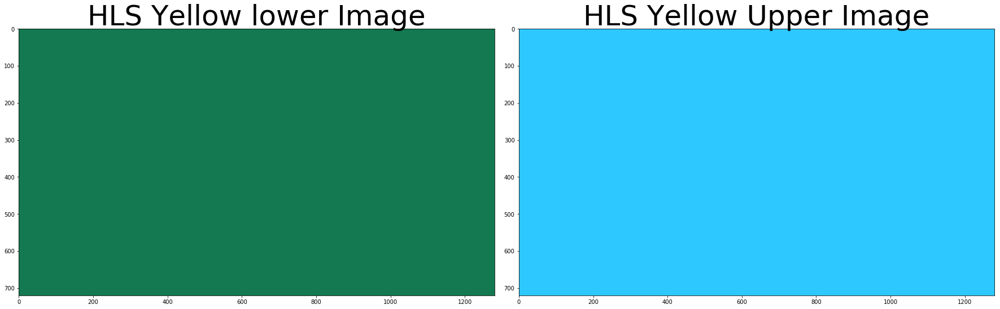

In [37]:
#
# HLS Yellow 
#
binary[:,:,0] = 20
binary[:,:,1] = 120
binary[:,:,2] = 80
binary2[:,:,0] = 45
binary2[:,:,1] = 200
binary2[:,:,2] = 255



displayImage2x1(binary,binary2,"HLS Yellow lower Image","HLS Yellow Upper Image",gray=True)


In [14]:
test_image = imread('./camera_cal/calibration13.jpg')
nx = 9
ny = 6

In [15]:
def corners_unwarp(img, nx, ny, mtx, dist):

    undist = cv2.undistort(img, mtx, dist, None, mtx)
    # Convert undistorted image to grayscale
    gray = cv2.cvtColor(undist, cv2.COLOR_RGB2GRAY)
    # Search for corners in the grayscaled image
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

    if ret == True:
        # If we found corners, draw them! (just for fun)
        cv2.drawChessboardCorners(undist, (nx, ny), corners, ret)
        # Choose offset from image corners to plot detected corners
        # This should be chosen to present the result at the proper aspect ratio
        # My choice of 100 pixels is not exact, but close enough for our purpose here
        offset = 100 # offset for dst points
        # Grab the image shape
        img_size = (gray.shape[1], gray.shape[0])

        # For source points I'm grabbing the outer four detected corners
        src = np.float32([corners[0], corners[nx-1], corners[-1], corners[-nx]])
        # For destination points, I'm arbitrarily choosing some points to be
        # a nice fit for displaying our warped result 
        # again, not exact, but close enough for our purposes
        dst = np.float32([[offset, offset], [img_size[0]-offset, offset], 
                                     [img_size[0]-offset, img_size[1]-offset], 
                                     [offset, img_size[1]-offset]])
        # Given src and dst points, calculate the perspective transform matrix
        M = cv2.getPerspectiveTransform(src, dst)
        # Warp the image using OpenCV warpPerspective()
        warped = cv2.warpPerspective(undist, M, img_size)

    # Return the resulting image and matrix
    return warped, M


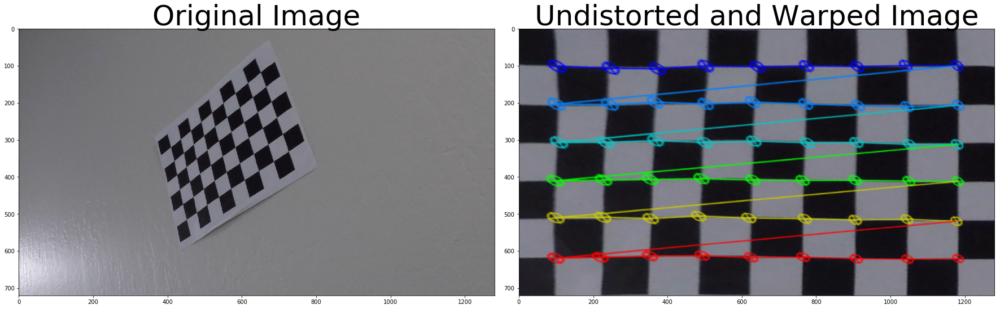

In [16]:
top_down, perspective_M = corners_unwarp(test_image, nx, ny, mtx, dist)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(test_image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(top_down)
ax2.set_title('Undistorted and Warped Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [10]:
##
## save function
##

def saveImage(targetDir,filename,image):
    savefile = os.path.join(targetDir,filename)
    imsave(savefile,image)
    

In [20]:
targetDir = "undistort"

for fn, undistf in zip(filenames,undist_images):
    saveImage(targetDir,fn,undistf)

In [22]:
[ im.shape[:2] for im in undist_images    ]

[(720, 1280),
 (720, 1280),
 (720, 1280),
 (720, 1280),
 (720, 1280),
 (720, 1280),
 (720, 1280),
 (720, 1280)]


## review onward project steps ## 
---

*    Camera calibration
*    Distortion correction
*    Color/gradient threshold
*    Perspective transform


# Disply Test Images #

## Undistort image of  all testing images ##

***

* some of images are slightly cut from bottom line when applying cv2.undistort based on camera calibration parameters


In [17]:
#
#  with cv2 undistort :
#  input parameters       image
#                         mtx    <---- from camera calibration (pickle file)
#                         dist   <---- from camera calibration (pickle file)
#
#  images <-- skimage.io.image process (RGB format)
#
undist_images = list(map(lambda image:cv2.undistort(image, mtx, dist, None, mtx), images) )   

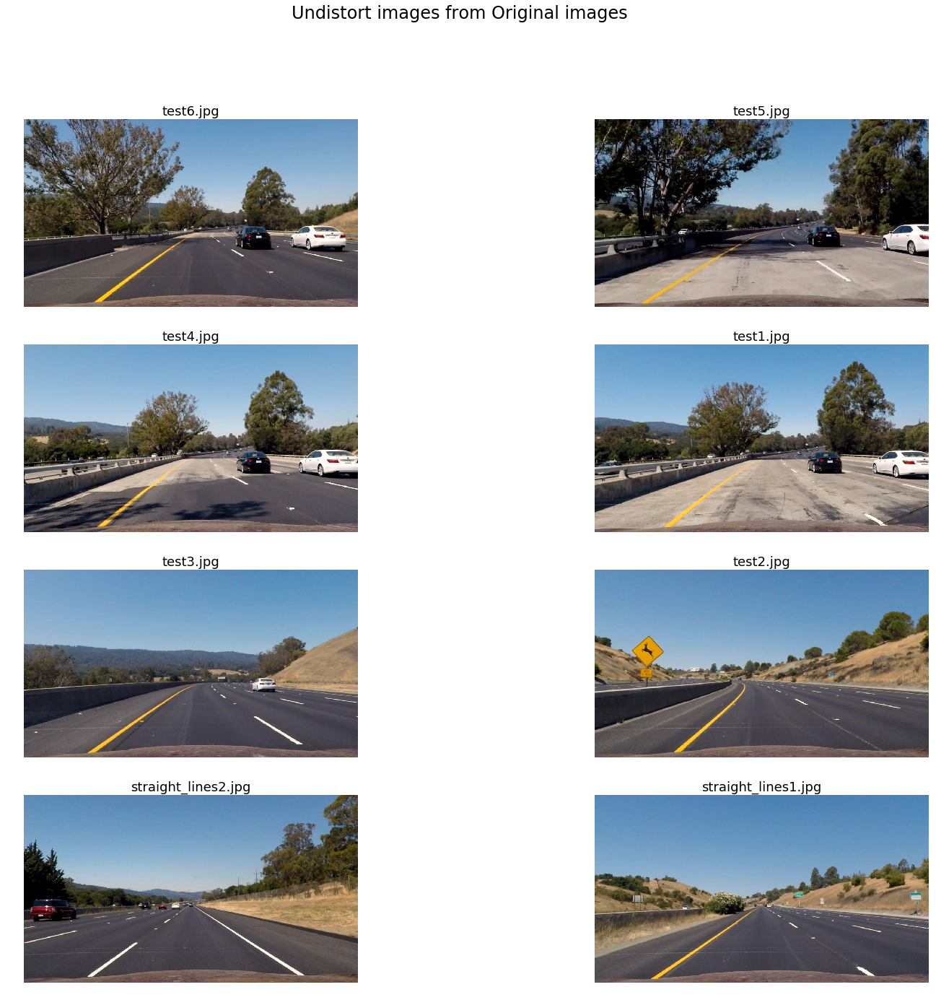

In [18]:
# 
#  display undistor test images 
#
displayImage2x4(filenames,undist_images,"Undistort images from Original images")


## copy undistortion image into image ## (for binary filtering)

In [19]:
images = undist_images.copy()

## Finding Lanes (Sobel technique) ##

In [20]:
def abs_sobel_thresh(img, orient='x', thresh_min=0, thresh_max=255):

    if orient == 'x':
        yorder = 0
        xorder = 1
    else:
        yorder = 1
        xorder = 0    
    
    # Apply the following steps to img
    # 1) Convert to grayscale (RGB -> GRAY)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    sobelx = cv2.Sobel(gray, cv2.CV_64F, xorder, yorder)
    # 3) Take the absolute value of the derivative or gradient
    sobel = np.absolute(sobelx)
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    sobel = np.uint8( 255 * sobel / np.max(sobel))
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    sxbinary = threshold(sobel,thresh_min,thresh_max)
    #sxbinary = np.zeros_like(sobel)
    #sxbinary[(sobel >= thresh_min) & (sobel <= thresh_max)] = 1
    return sxbinary
    
    # Run the function
    #grad_binary = abs_sobel_thresh(image, orient='x', thresh_min=20, thresh_max=100)
    # Plot the result

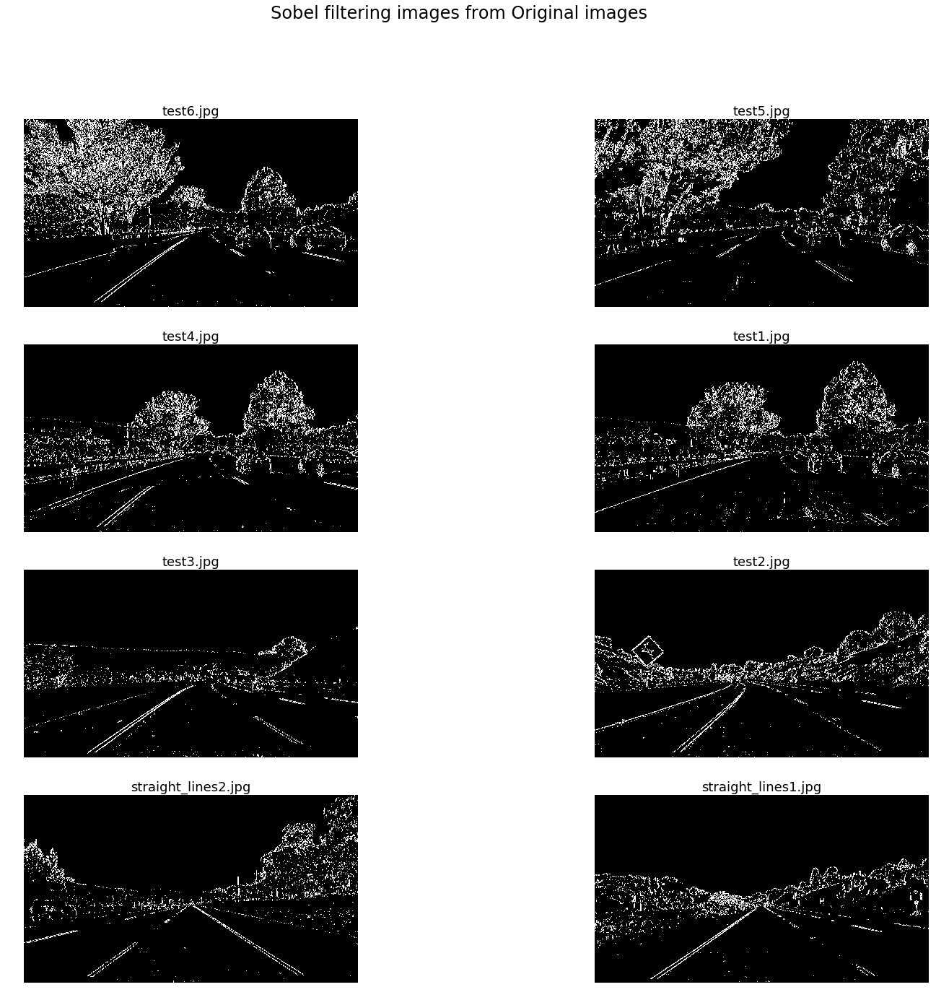

In [37]:
sobel_ops = lambda x:abs_sobel_thresh(x, orient='x', thresh_min=20, thresh_max=100)
sobel_images = list( map( sobel_ops, images) )

displayImage2x4(filenames,sobel_images,"Sobel filtering images from Original images",gray=True)

## Finding Lanes (Sobel Magnitude technique) ##

In [22]:
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    # vertical and holizontal gradient 
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    # 3) Take the absolute value of the derivative or gradient
    # magunitude
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    sobel = np.sqrt( abs_sobelx **2 + abs_sobely ** 2  )
    
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    sobel = np.uint8( 255 * sobel / np.max(sobel))
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    
    sxbinary = threshold(sobel,mag_thresh[0],mag_thresh[1])
    # 2) Take the gradient in x and y separately
    # 3) Calculate the magnitude 
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    # 5) Create a binary mask where mag thresholds are met
    # 6) Return this mask as your binary_output image
    #binary_output = np.copy(img) # Remove this line
    return sxbinary
    
    # Run the function
    #mag_binary = mag_thresh(image, sobel_kernel=3, mag_thresh=(30, 100))
    # Plot the result

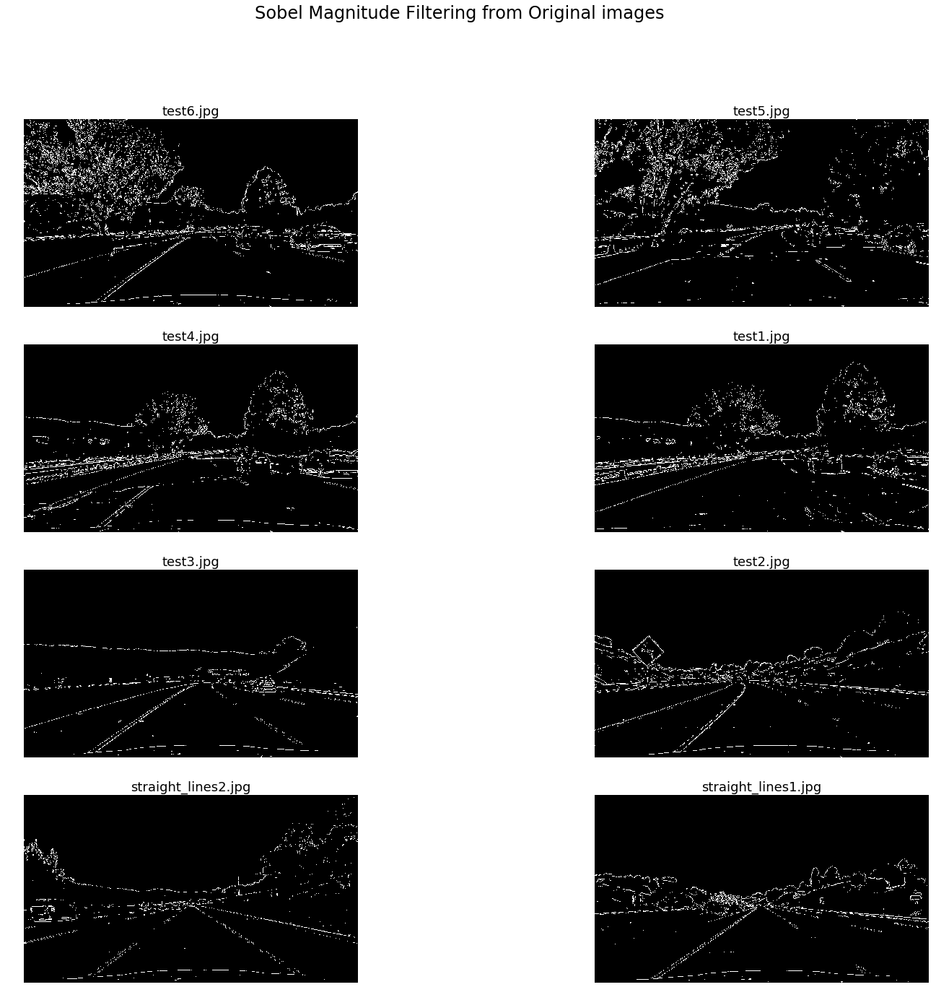

In [23]:
mag_ops = lambda x:mag_thresh(x, sobel_kernel=3, mag_thresh=(50, 100))
mag_images = list( map( mag_ops, images  ))

displayImage2x4(filenames,mag_images,"Sobel Magnitude Filtering from Original images",gray=True)

## Direction of Gradient filter ##

In [24]:
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    # 2) Take the gradient in x and y separately
    # 3) Take the absolute value of the x and y gradients
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    # 5) Create a binary mask where direction thresholds are met
    # 6) Return this mask as your binary_output image
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    # 3) Take the absolute value of the derivative or gradient
    # magunitude
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    sobel = np.arctan2(abs_sobely, abs_sobelx)
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    #sobel = np.uint8( 255 * sobel / np.max(sobel))
    #print(sobel)
    # 5) Create a binary mask where mag thresholds are met
    sxybinary = np.zeros_like(sobel)
    sxybinary[(sobel > thresh[0]) & (sobel < thresh[1])] = 1    
    #binary_output = np.copy(img) # Remove this line
    return sxybinary
    

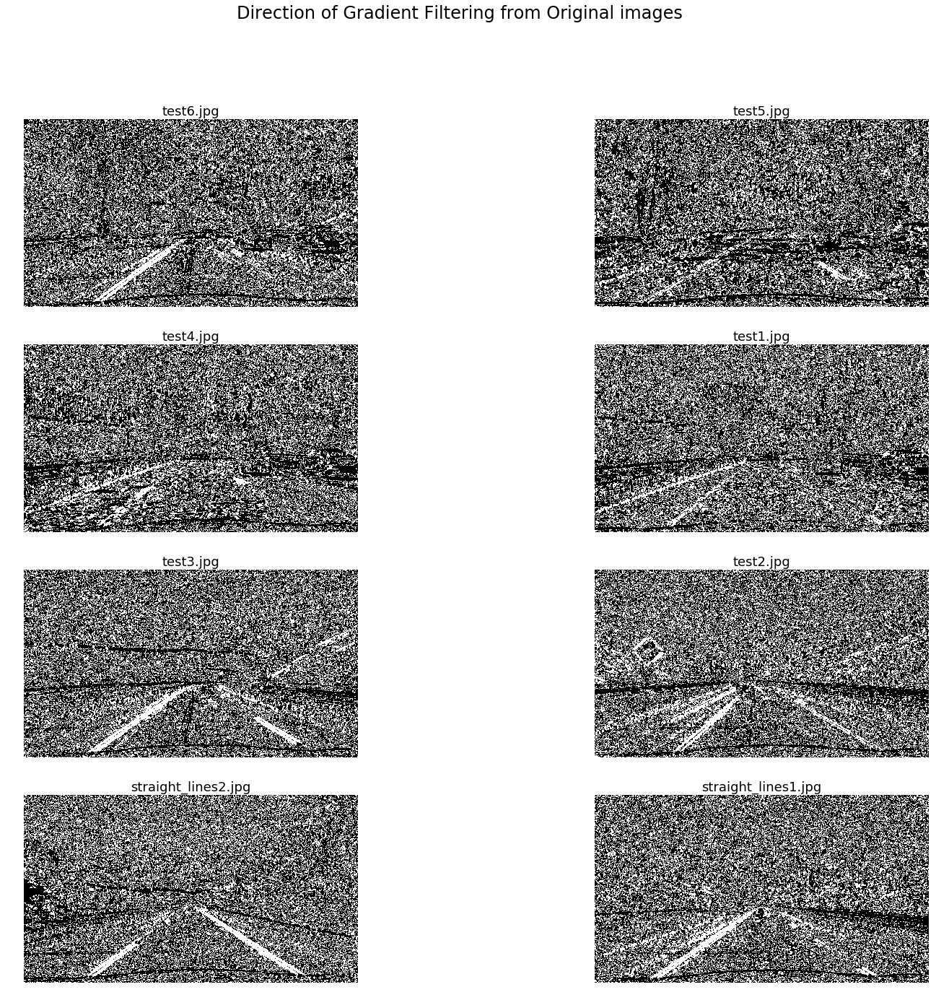

In [25]:
dir_ops = lambda x:dir_threshold(x, sobel_kernel=15, thresh=(0.7, 1.3))
dir_images = list( map(dir_ops, images))

displayImage2x4(filenames,dir_images,"Direction of Gradient Filtering from Original images",gray=True)

## Combination Technique (Sobel / Magnitude / Direction of Graditude) ##

In [26]:
def applyCombinedGradient(image):
    ksize=3
    sobel_imagex = abs_sobel_thresh(image, orient='x', thresh_min=50, thresh_max=100)
    sobel_imagey = abs_sobel_thresh(image, orient='y', thresh_min=50, thresh_max=100)
    mag_binary = mag_thresh(image, sobel_kernel=ksize, mag_thresh=(30, 255))
    dir_binary = dir_threshold(image, sobel_kernel=ksize, thresh=(0.7, 1.3))
    
    mybinary = np.zeros_like(dir_binary)
    mybinary[ ((sobel_imagex == 1) & (sobel_imagey == 1)) | ( (mag_binary == 1) & (dir_binary == 1)      )      ] = 1

    return mybinary

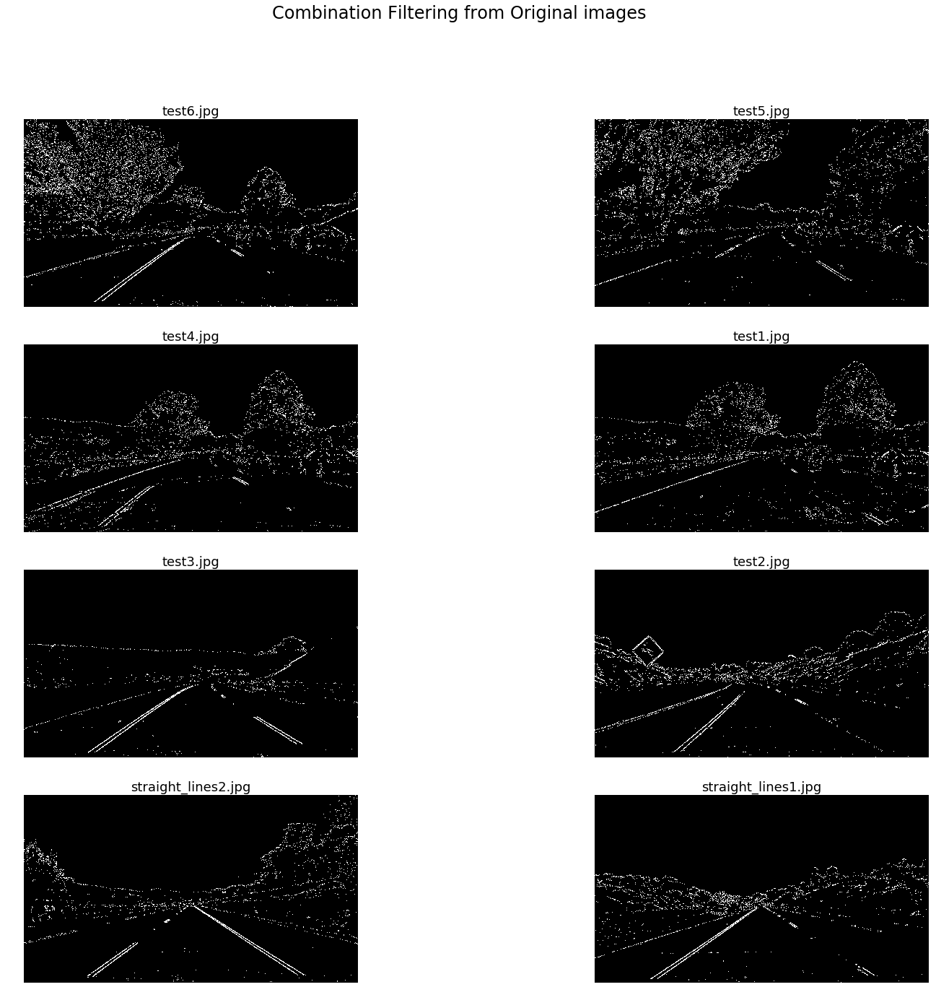

In [27]:
combination_binary_ops = lambda x:applyCombinedGradient(x)
combination_binary_images = list(map(combination_binary_ops,images))

#
# Now, it is time to make combination filtering (sobel / magnitude / direction) from original images
# to see how the lane lines are showed / filtered on binary image.


displayImage2x4(filenames,combination_binary_images,"Combination Filtering from Original images",gray=True)

### By applying several filtering technique on multi layered, lane lines are fairly enough to show, however we cannot extract lane lines of road images in accurate. In a special, test5.jpg has lots of contracts since tree shade is seen on the road, I could not draw lane line with binary image of Sobel / Direction, even combination technique.

## Now try to use HLS 

based on textbook comments

* Saturation also plays a part in this; saturation is a measurement of colorfulness. So, as colors get lighter and closer to white, they have a lower saturation value, whereas colors that are the most intense, like a bright primary color (imagine a bright red, blue, or yellow), have a high saturation value. 

So, I will try to extract lane lines with S channel filtering (tweak parameters) 

In [28]:
def s_threshold(img, thresh=(0, 255)):
    
    # input is RGB (skimage.io.imread)
    
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    S = hls[:,:,2]  # 2 <-- S channel     
    
    binary = np.zeros_like(S)
    binary[(S > thresh[0]) & (S <= thresh[1])] = 1

    return binary

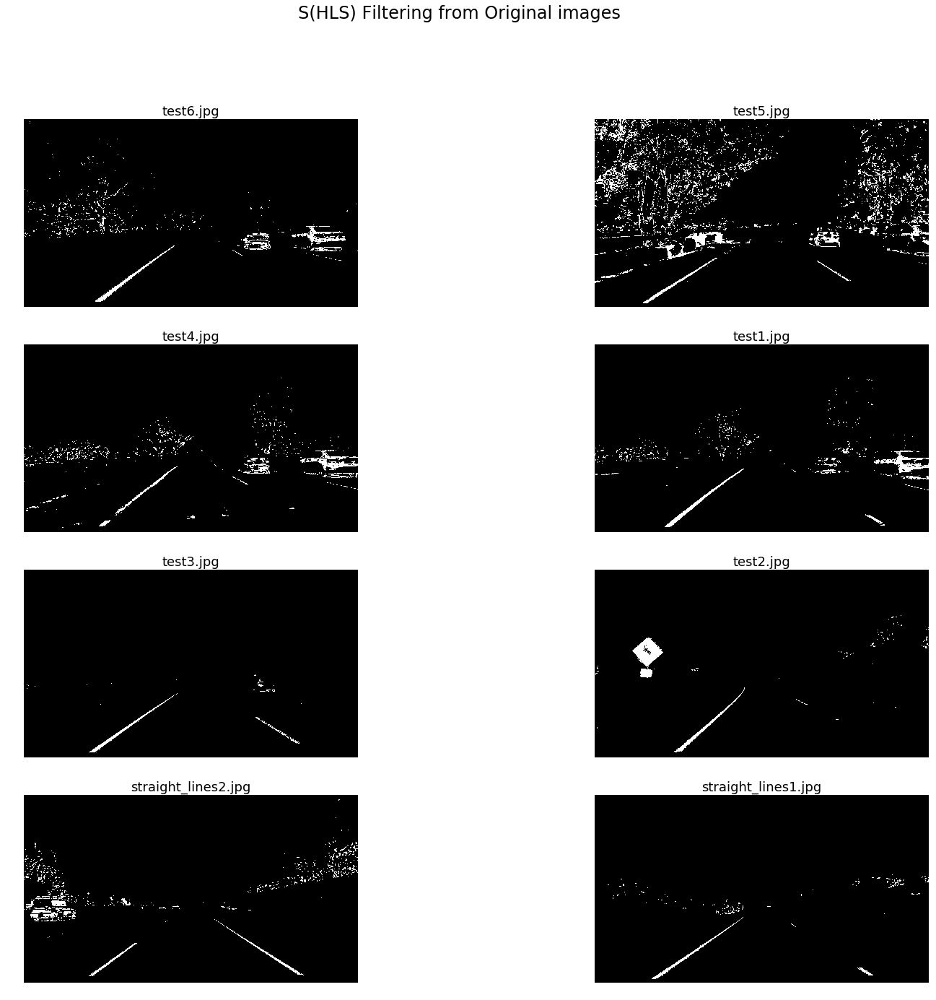

In [30]:
hls_ops = lambda x:s_threshold(x, thresh=(170,255))
hls_images = list(map( hls_ops, images ))

displayImage2x4(filenames,hls_images,"S(HLS) Filtering from Original images",gray=True)

## See the comparison image by Binary Filtering type
***
* I have picked up test5.jpg which has tree shade on left lane of the road, so that it could be difficult to pick up the lames.
* S channel is designated to be a robust expression to highlight lane line from road image.

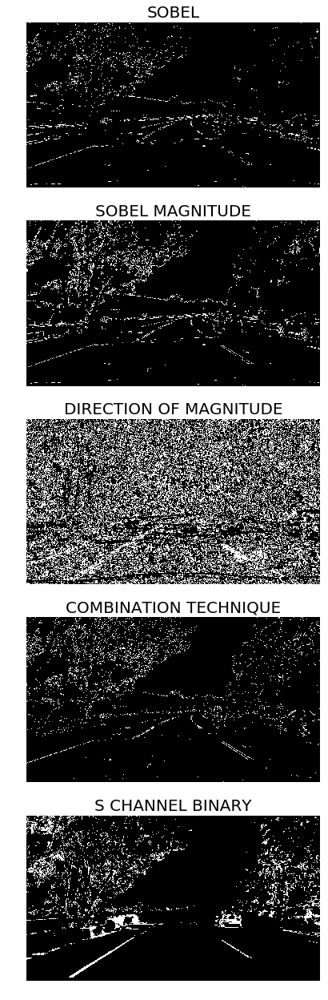

In [31]:
#
#  idx == 1 : test5.jpg -- has a shadow over the road so that there are much contrast on the road and the lane lines.
#

for idx,(sobel,mag,direct,combi,hls) in enumerate(zip(sobel_images,mag_images,dir_images,combination_binary_images,hls_images)):
    if idx == 1:
        plt.figure(figsize=(26,22))
        #plt.suptitle("Compare.", fontsize=24)
        plt.subplot(5,1,1)
        plt.imshow(sobel, cmap = "gray")
        plt.title("SOBEL",fontsize=20)
        plt.axis('off')

        plt.subplot(5,1,2)
        plt.imshow(mag, cmap = "gray")
        plt.title("SOBEL MAGNITUDE",fontsize=20)
        plt.axis('off')

        plt.subplot(5,1,3)
        plt.imshow(direct, cmap = "gray")
        plt.title("DIRECTION OF MAGNITUDE",fontsize=20)
        plt.axis('off')

        plt.subplot(5,1,4)
        plt.imshow(combi, cmap = "gray")
        plt.title("COMBINATION TECHNIQUE",fontsize=20)
        plt.axis('off')

        plt.subplot(5,1,5)
        plt.imshow(hls, cmap = "gray")
        plt.title("S CHANNEL BINARY",fontsize=20)
        plt.axis('off')
        
        
        


In [ ]:
## Compare Original / Colored (Blue/Gren) / SOLBEL S + HLS Image ###

(-0.5, 1279.5, 719.5, -0.5)

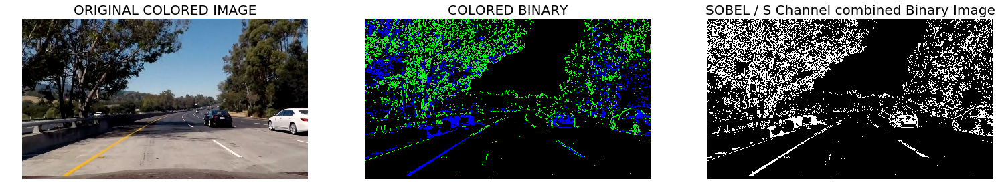

In [55]:
#
# colored binary is 3 channel to integrate binary images (eg. sobel / S_channel etc.)
#

color_binary = np.zeros_like(sobel_images[1])
color_binary = np.dstack(( np.zeros_like(sobel_images[1]), sobel_images[1], hls_images[1])) * 255

combined_binary = np.zeros_like(hls_images[1])
combined_binary[ (sobel_images[1] == 1)  | ( hls_images[1] == 1) ] = 1


plt.figure(figsize=(26,22))
#plt.suptitle("Compare.", fontsize=24)
plt.subplot(1,3,1)
plt.imshow(images[1] )
plt.title("ORIGINAL COLORED IMAGE",fontsize=20)
plt.axis('off')

plt.subplot(1,3,2)
plt.imshow(color_binary)
plt.title("COLORED BINARY",fontsize=20)
plt.axis('off')

plt.subplot(1,3,3)
plt.imshow(combined_binary, cmap = "gray")
plt.title("SOBEL / S Channel combined Binary Image",fontsize=20)
plt.axis('off')



In [66]:

def makeCombinedBinary(image, s_thresh=(170, 255), sx_thresh=(20, 100)):
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    s_image = hls[:,:,2]
    l_image = hls[:,:,1]

    sobelx = cv2.Sobel(l_image, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    #plt.imshow(sxbinary)
    
    # Threshold color channel
    s_binary = np.zeros_like(s_image)
    s_binary[(s_image >= s_thresh[0]) & (s_image <= s_thresh[1])] = 1
    # Stack each channel
    # Note color_binary[:, :, 0] is all 0s, effectively an all black image. It might
    # be beneficial to replace this channel with something else.
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary   )) * 255
    
    # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1
    return color_binary, combined_binary
    

(-0.5, 1279.5, 719.5, -0.5)

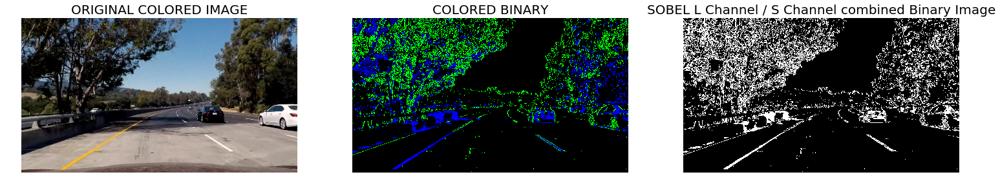

In [67]:
color_binary, combined_binary =  makeCombinedBinary(images[1])
plt.figure(figsize=(26,22))
#plt.suptitle("Compare.", fontsize=24)
plt.subplot(1,3,1)
plt.imshow(images[1] )
plt.title("ORIGINAL COLORED IMAGE",fontsize=20)
plt.axis('off')

plt.subplot(1,3,2)
plt.imshow(color_binary)
plt.title("COLORED BINARY",fontsize=20)
plt.axis('off')

plt.subplot(1,3,3)
plt.imshow(combined_binary, cmap = "gray")
plt.title("SOBEL L Channel / S Channel combined Binary Image",fontsize=20)
plt.axis('off')
